In [ ]:
!unzip /content/archive_5.zip -d /content/images

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from tqdm import tqdm
import torchvision.datasets as datasets
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
import torchvision.utils as vutils
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from torch.utils.data import Subset
import numpy as np

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
LEARNING_RATE = 2e-4  # could also use two lrs, one for gen and one for disc
BATCH_SIZE = 64
IMAGE_SIZE = 128
CHANNELS_IMG = 3
Z_DIM = 200
NUM_EPOCHS = 100
FEATURES_DISC = 128
FEATURES_GEN = 128

In [ ]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])


dataset = datasets.ImageFolder('/content/images', transform=transform)
dataloader = DataLoader(dataset=dataset, batch_size=BATCH_SIZE, shuffle=True)

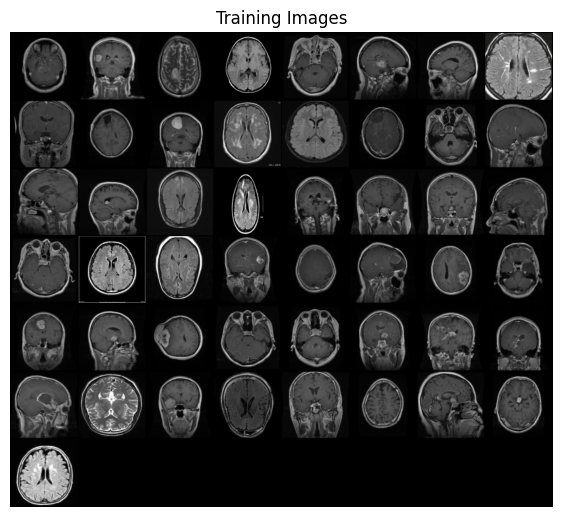

In [ ]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(7,7))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:49], padding=2, normalize=True).cpu(),(1,2,0)))

In [ ]:
import torch.nn as nn

class Generator(nn.Module):
    def __init__(self, ngpu, nz, ngf, nc):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # Input: Z latent vector into a convolution
            nn.ConvTranspose2d(nz, ngf * 16, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 16),
            nn.ReLU(True),
            # State size: (ngf * 16) x 4 x 4
            nn.ConvTranspose2d(ngf * 16, ngf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # State size: (ngf * 8) x 8 x 8
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # State size: (ngf * 4) x 16 x 16
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # State size: (ngf * 2) x 32 x 32
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # State size: (ngf) x 64 x 64
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # Output size: (nc) x 128 x 128
        )

    def forward(self, x):
        return self.main(x)


In [ ]:
import torch.nn as nn

class Discriminator(nn.Module):
    def __init__(self, nc, ndf):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # Input: (nc) x 128 x 128
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (ndf) x 64 x 64
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (ndf * 2) x 32 x 32
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (ndf * 4) x 16 x 16
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (ndf * 8) x 8 x 8
            nn.Conv2d(ndf * 8, ndf * 16, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 16),
            nn.LeakyReLU(0.2, inplace=True),
            # State size: (ndf * 16) x 4 x 4
            nn.Conv2d(ndf * 16, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
            # Output size: 1
        )

    def forward(self, x):
        return self.main(x)


In [ ]:
def initialize_weights(model):
    classname = model.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(model.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(model.weight.data, 1.0, 0.02)
        nn.init.constant_(model.bias.data, 0)

In [ ]:
gen = Generator(1, Z_DIM, FEATURES_GEN, CHANNELS_IMG).to(device)

disc = Discriminator(CHANNELS_IMG, FEATURES_DISC).to(device)

initialize_weights(gen)
initialize_weights(disc)

In [ ]:
opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
opt_disc = optim.Adam(disc.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
criterion = nn.BCELoss()

fixed_noise = torch.randn(32, Z_DIM, 1, 1).to(device)

In [ ]:
def show_tensor_images(image_tensor, num_images=32, size=(1, 64, 64)):
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=4)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

Epoch [0/100] Batch 0/110                   Loss D: 0.4148, loss G: 2.7166


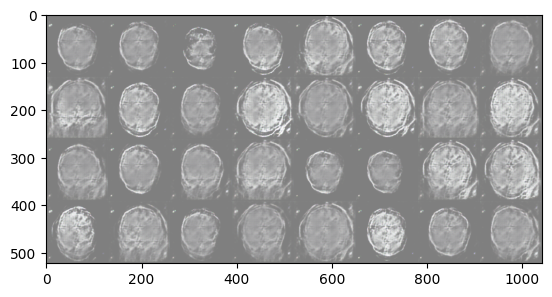

Epoch [0/100] Batch 50/110                   Loss D: 0.2272, loss G: 2.8683


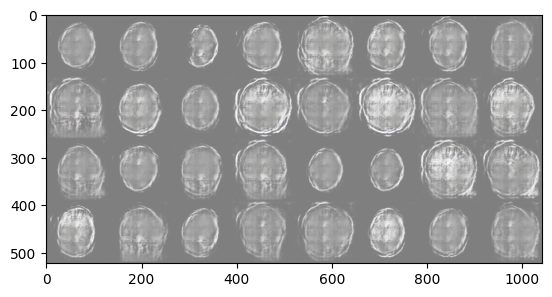

Epoch [0/100] Batch 100/110                   Loss D: 0.5491, loss G: 4.5091


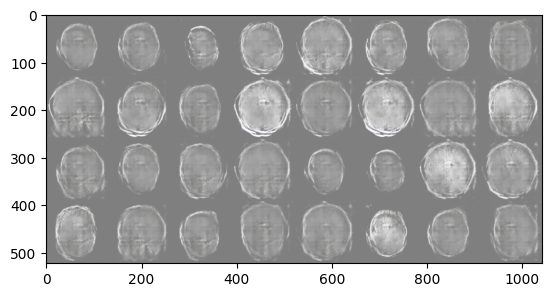

Epoch [1/100] Batch 0/110                   Loss D: 0.2098, loss G: 1.1769


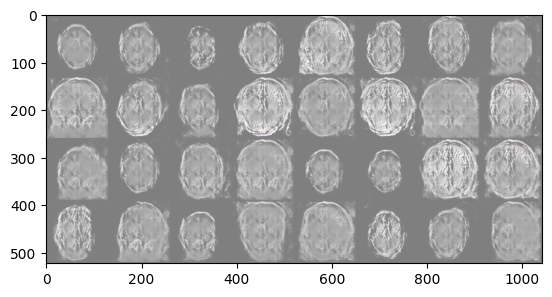

Epoch [1/100] Batch 50/110                   Loss D: 0.6736, loss G: 4.6569


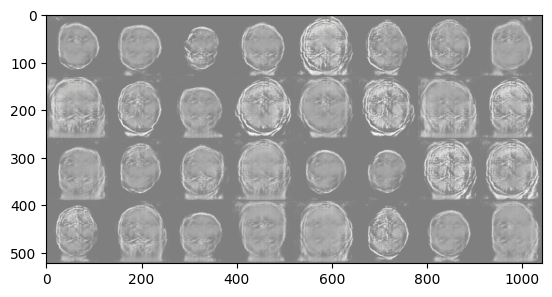

Epoch [1/100] Batch 100/110                   Loss D: 0.8816, loss G: 1.8549


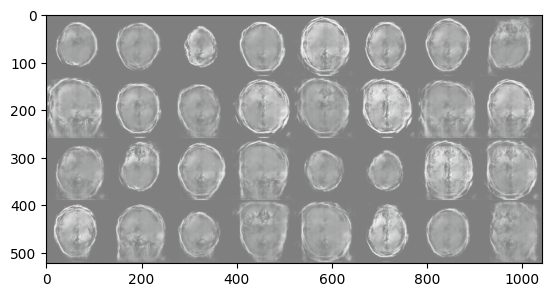

Epoch [2/100] Batch 0/110                   Loss D: 0.2085, loss G: 2.8377


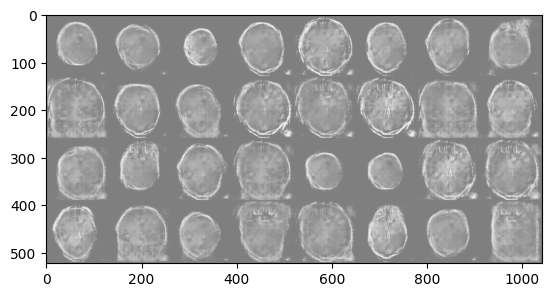

Epoch [2/100] Batch 50/110                   Loss D: 0.4149, loss G: 2.9760


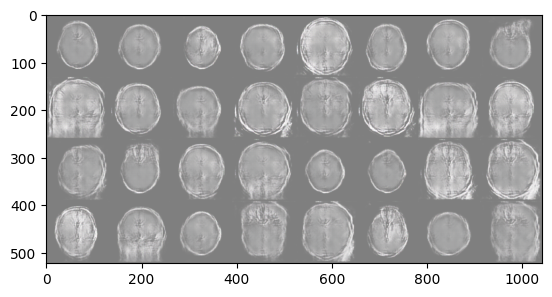

Epoch [2/100] Batch 100/110                   Loss D: 0.2700, loss G: 4.9223


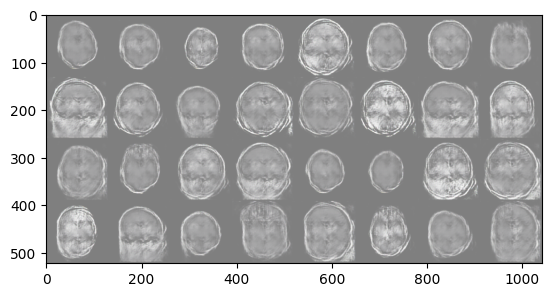

Epoch [3/100] Batch 0/110                   Loss D: 0.3555, loss G: 3.4003


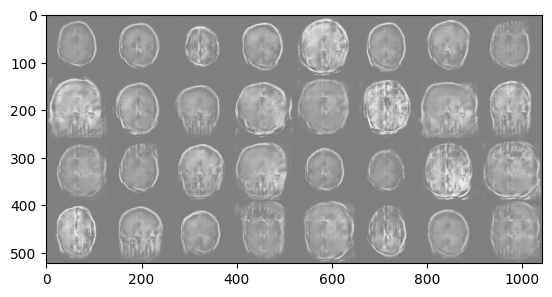

Epoch [3/100] Batch 50/110                   Loss D: 0.4527, loss G: 3.1270


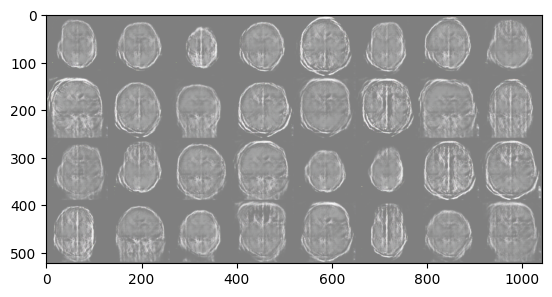

Epoch [3/100] Batch 100/110                   Loss D: 0.2896, loss G: 2.6217


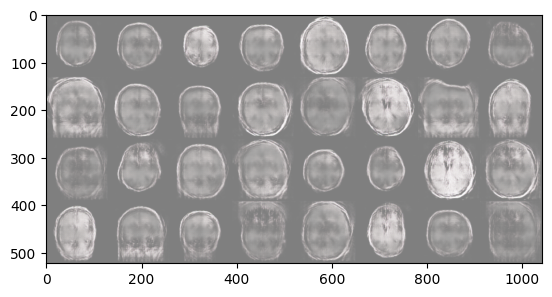

Epoch [4/100] Batch 0/110                   Loss D: 0.3067, loss G: 2.4767


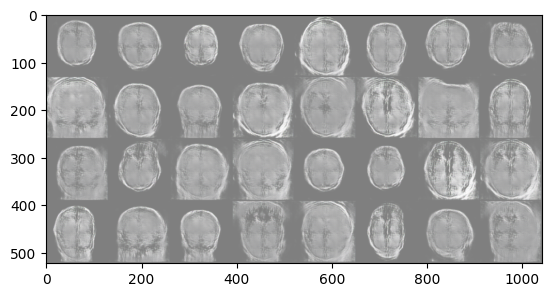

Epoch [4/100] Batch 50/110                   Loss D: 0.3084, loss G: 2.2415


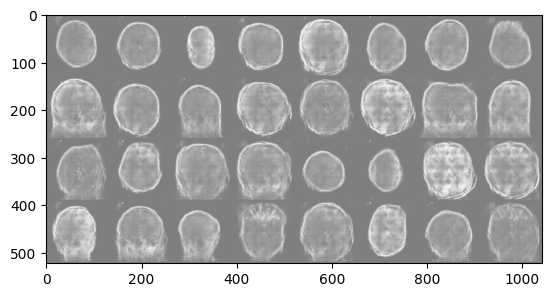

Epoch [4/100] Batch 100/110                   Loss D: 0.3999, loss G: 4.0798


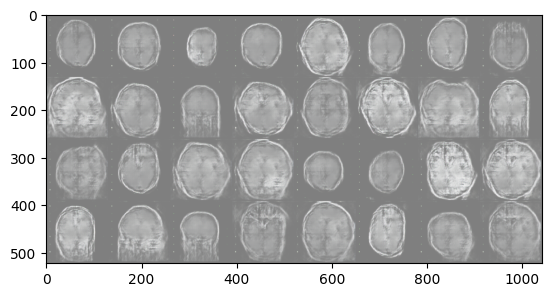

Epoch [5/100] Batch 0/110                   Loss D: 0.3868, loss G: 5.6602


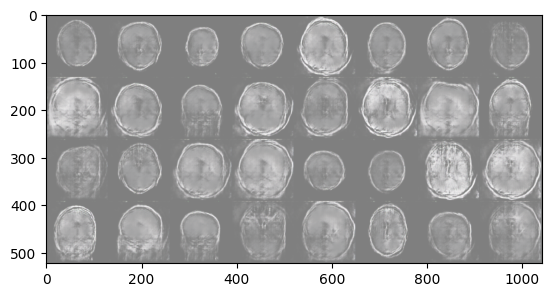

Epoch [5/100] Batch 50/110                   Loss D: 0.2138, loss G: 2.5976


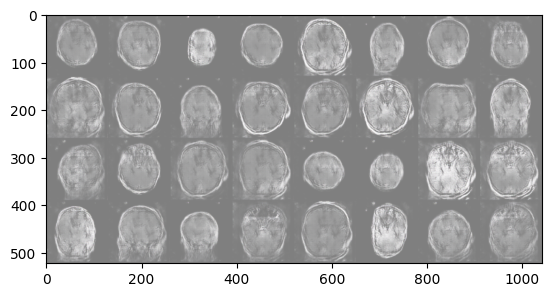

Epoch [5/100] Batch 100/110                   Loss D: 0.4529, loss G: 0.8400


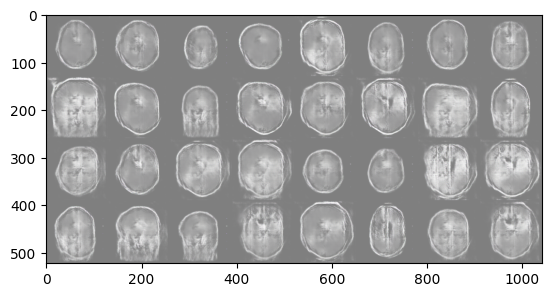

Epoch [6/100] Batch 0/110                   Loss D: 0.3768, loss G: 3.6095


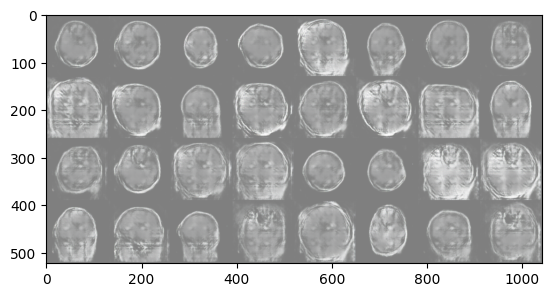

Epoch [6/100] Batch 50/110                   Loss D: 0.3081, loss G: 3.3699


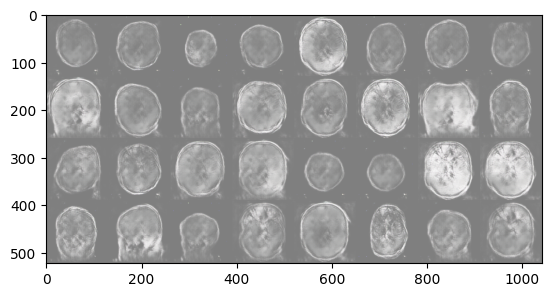

Epoch [6/100] Batch 100/110                   Loss D: 0.3598, loss G: 1.3604


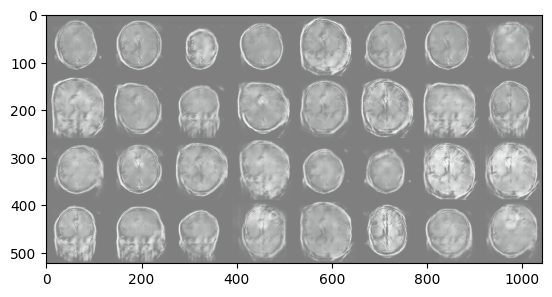

Epoch [7/100] Batch 0/110                   Loss D: 1.4472, loss G: 2.2044


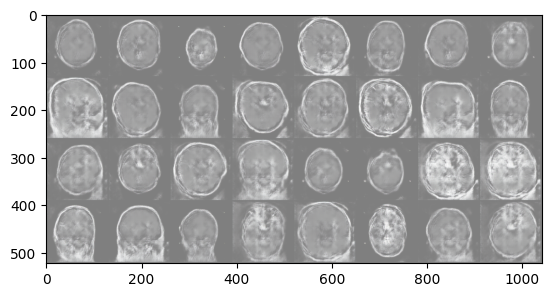

Epoch [7/100] Batch 50/110                   Loss D: 0.4906, loss G: 1.4064


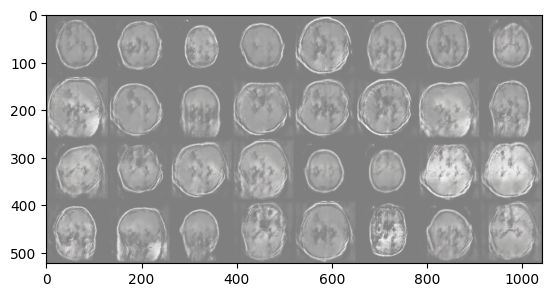

Epoch [7/100] Batch 100/110                   Loss D: 0.5889, loss G: 1.2411


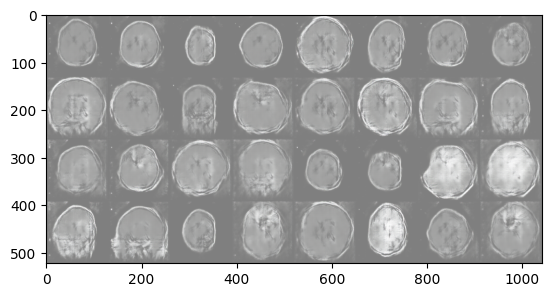

Epoch [8/100] Batch 0/110                   Loss D: 0.2650, loss G: 4.4374


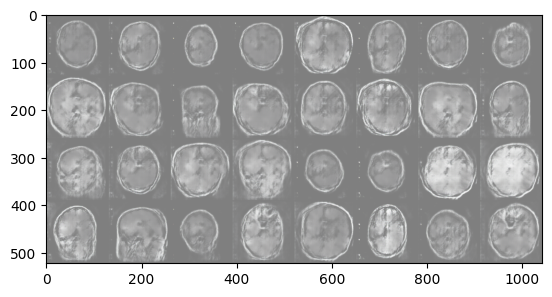

Epoch [8/100] Batch 50/110                   Loss D: 0.5608, loss G: 6.5100


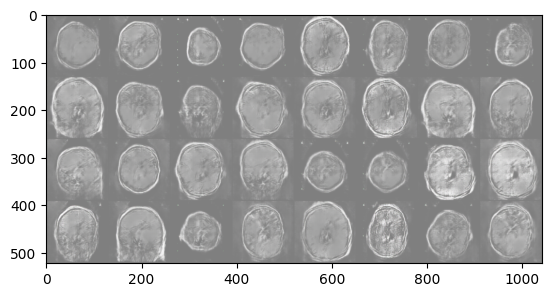

Epoch [8/100] Batch 100/110                   Loss D: 0.3000, loss G: 1.3923


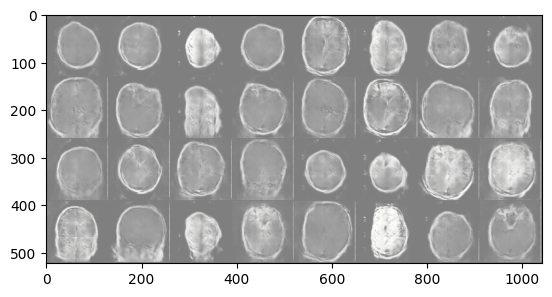

Epoch [9/100] Batch 0/110                   Loss D: 0.2647, loss G: 3.9152


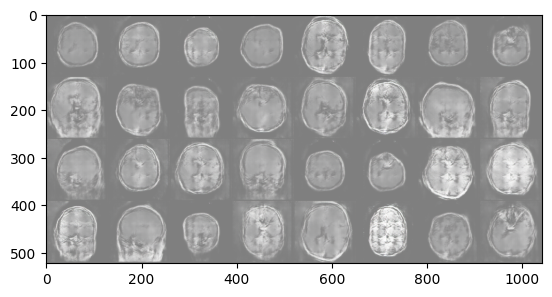

Epoch [9/100] Batch 50/110                   Loss D: 0.3654, loss G: 2.1915


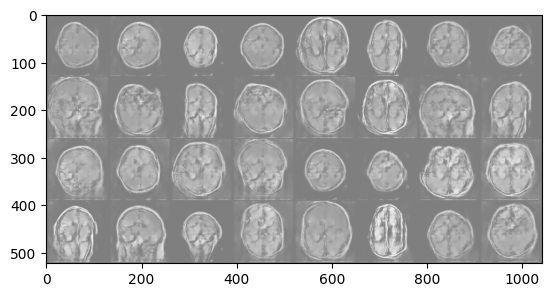

Epoch [9/100] Batch 100/110                   Loss D: 0.6085, loss G: 1.4361


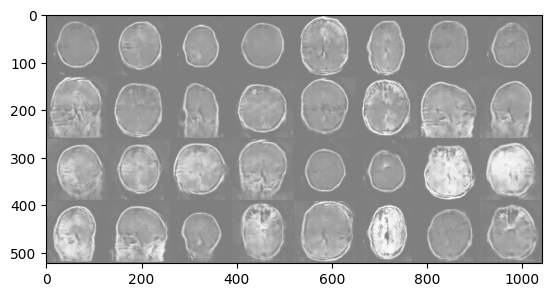

Epoch [10/100] Batch 0/110                   Loss D: 0.4023, loss G: 6.8238


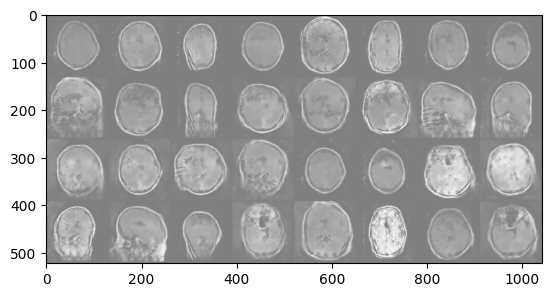

Epoch [10/100] Batch 50/110                   Loss D: 0.6891, loss G: 6.0748


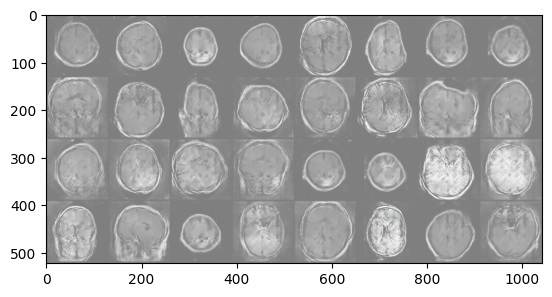

Epoch [10/100] Batch 100/110                   Loss D: 0.9241, loss G: 1.6806


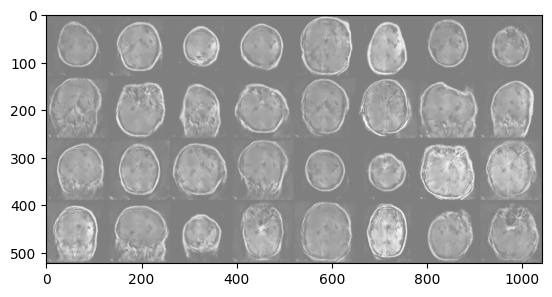

Epoch [11/100] Batch 0/110                   Loss D: 0.3485, loss G: 1.1264


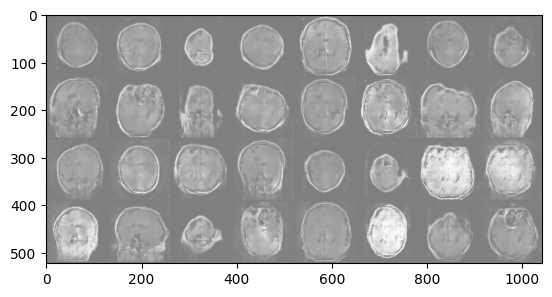

Epoch [11/100] Batch 50/110                   Loss D: 0.4520, loss G: 3.9499


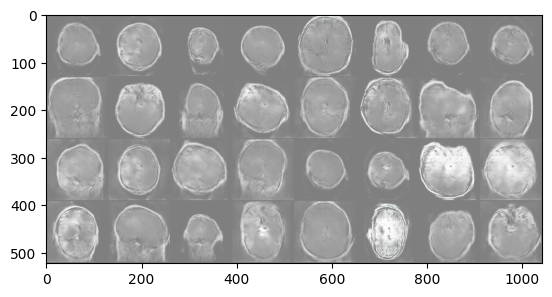

Epoch [11/100] Batch 100/110                   Loss D: 0.3399, loss G: 2.9522


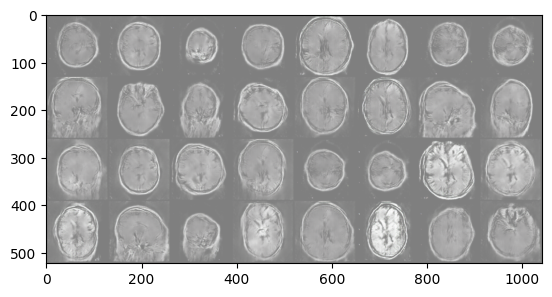

Epoch [12/100] Batch 0/110                   Loss D: 0.3486, loss G: 2.4518


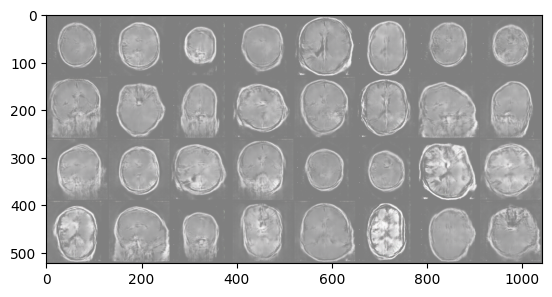

Epoch [12/100] Batch 50/110                   Loss D: 0.2580, loss G: 2.3059


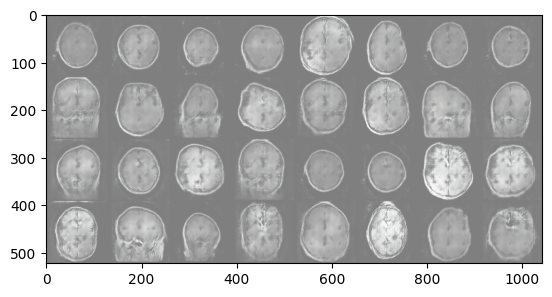

Epoch [12/100] Batch 100/110                   Loss D: 0.6151, loss G: 0.8934


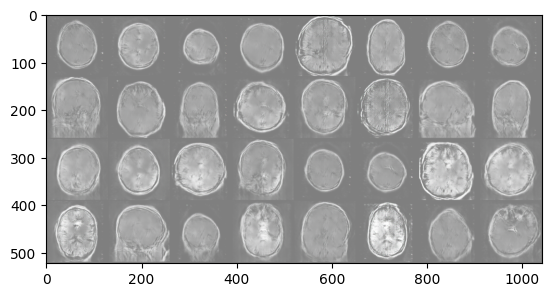

Epoch [13/100] Batch 0/110                   Loss D: 0.1518, loss G: 4.0560


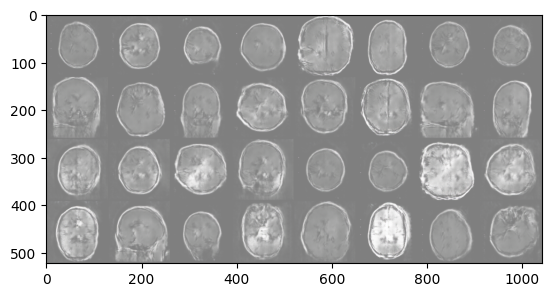

Epoch [13/100] Batch 50/110                   Loss D: 0.1717, loss G: 3.0920


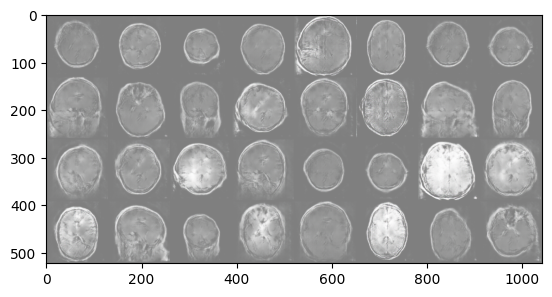

Epoch [13/100] Batch 100/110                   Loss D: 0.1225, loss G: 4.2623


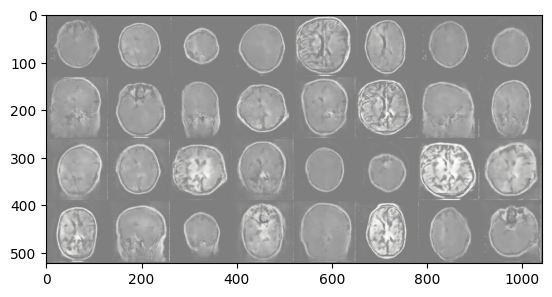

Epoch [14/100] Batch 0/110                   Loss D: 0.1954, loss G: 2.7697


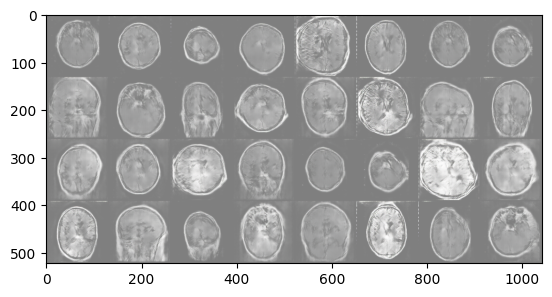

Epoch [14/100] Batch 50/110                   Loss D: 0.0967, loss G: 3.6484


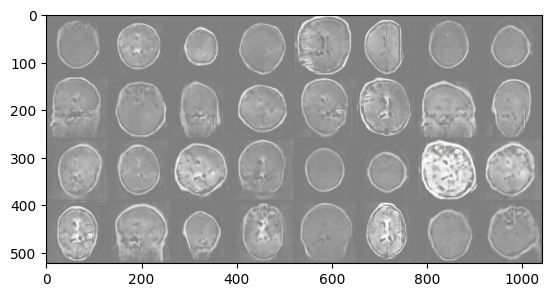

Epoch [14/100] Batch 100/110                   Loss D: 0.7375, loss G: 6.5231


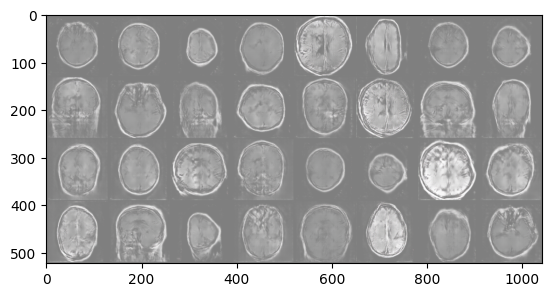

Epoch [15/100] Batch 0/110                   Loss D: 0.0957, loss G: 4.7311


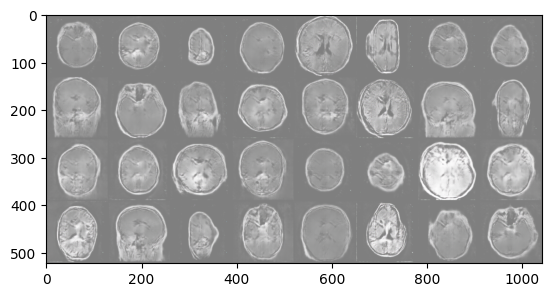

Epoch [15/100] Batch 50/110                   Loss D: 0.5251, loss G: 8.7169


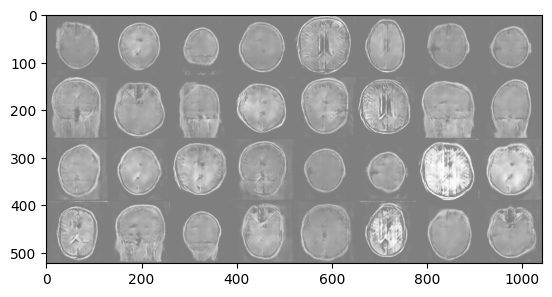

Epoch [15/100] Batch 100/110                   Loss D: 0.2104, loss G: 5.3438


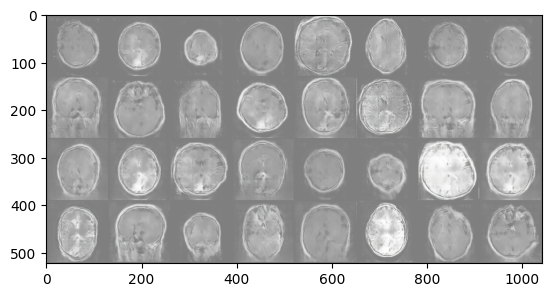

Epoch [16/100] Batch 0/110                   Loss D: 0.9185, loss G: 1.1817


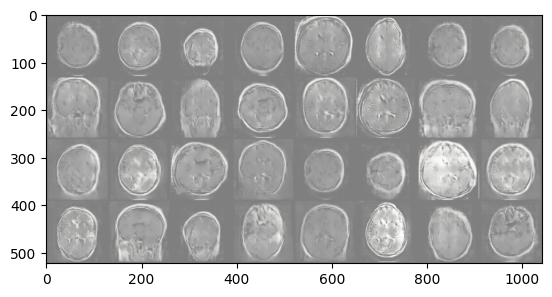

Epoch [16/100] Batch 50/110                   Loss D: 0.5135, loss G: 3.5726


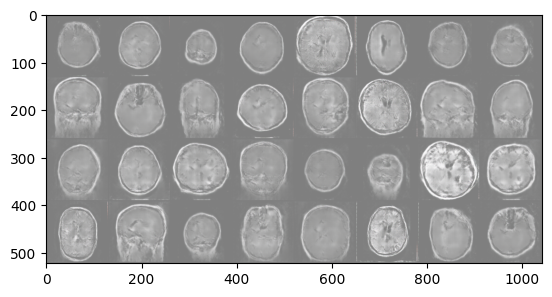

Epoch [16/100] Batch 100/110                   Loss D: 0.3285, loss G: 4.7980


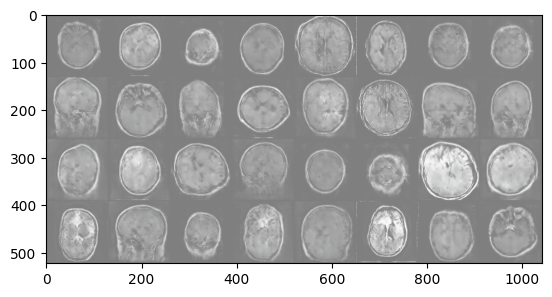

Epoch [17/100] Batch 0/110                   Loss D: 0.2551, loss G: 2.9109


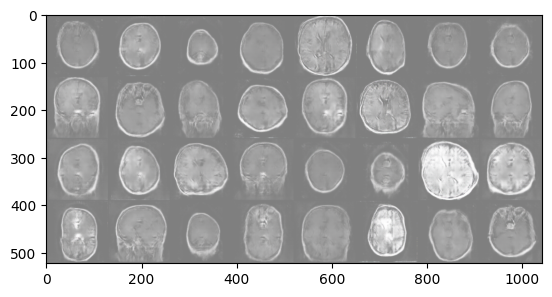

Epoch [17/100] Batch 50/110                   Loss D: 0.1112, loss G: 4.4573


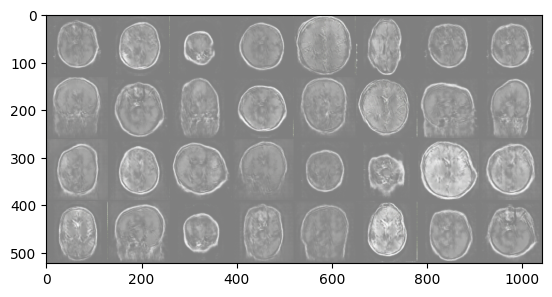

Epoch [17/100] Batch 100/110                   Loss D: 0.0986, loss G: 4.4062


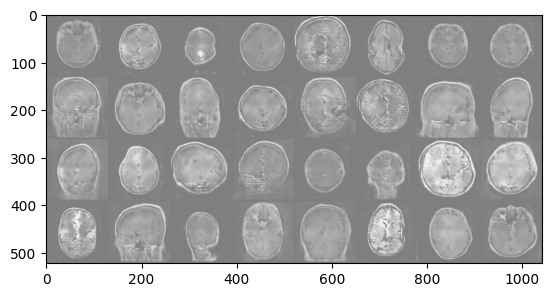

Epoch [18/100] Batch 0/110                   Loss D: 0.3845, loss G: 7.0513


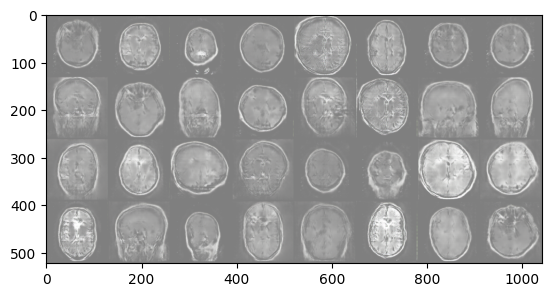

Epoch [18/100] Batch 50/110                   Loss D: 0.2651, loss G: 4.7741


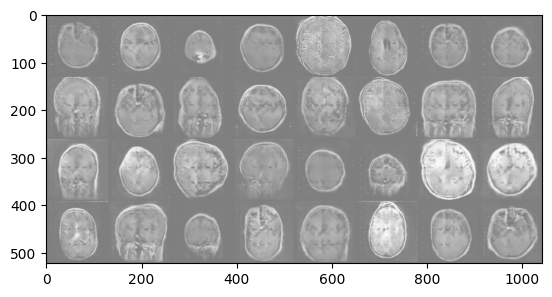

Epoch [18/100] Batch 100/110                   Loss D: 0.6371, loss G: 2.2607


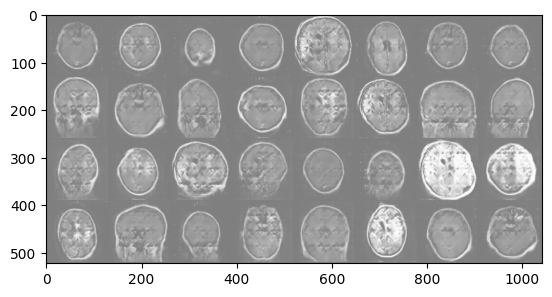

Epoch [19/100] Batch 0/110                   Loss D: 0.3296, loss G: 5.5546


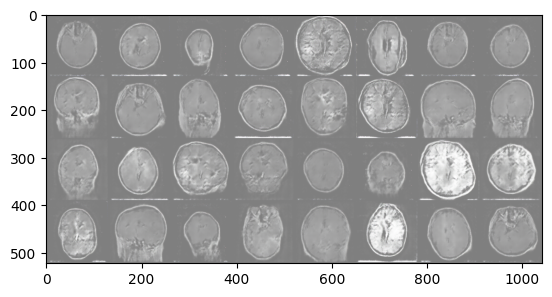

Epoch [19/100] Batch 50/110                   Loss D: 0.1723, loss G: 4.7726


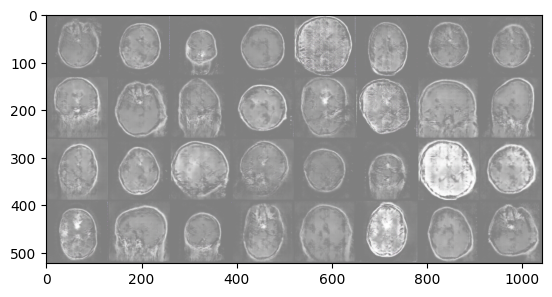

Epoch [19/100] Batch 100/110                   Loss D: 0.7444, loss G: 2.0233


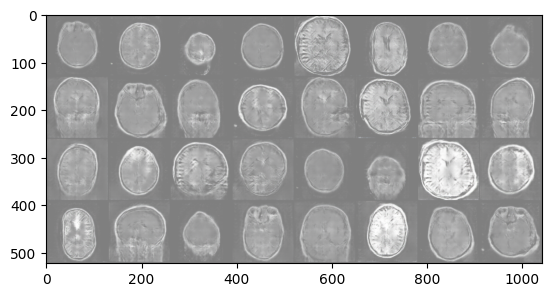

Epoch [20/100] Batch 0/110                   Loss D: 0.2577, loss G: 7.5435


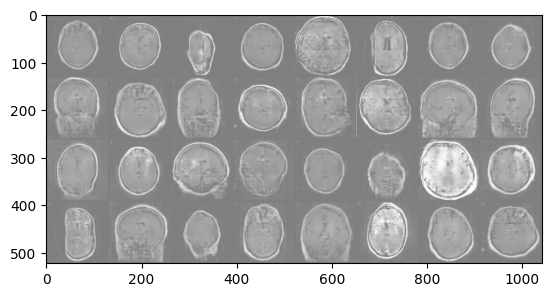

Epoch [20/100] Batch 50/110                   Loss D: 0.3079, loss G: 3.5180


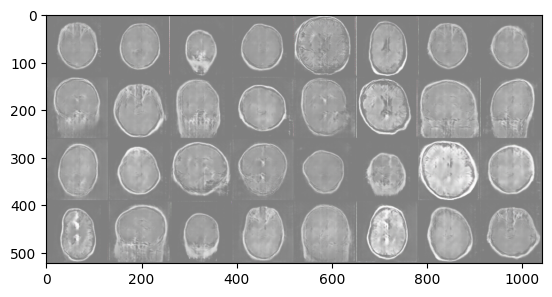

Epoch [20/100] Batch 100/110                   Loss D: 0.2420, loss G: 5.2498


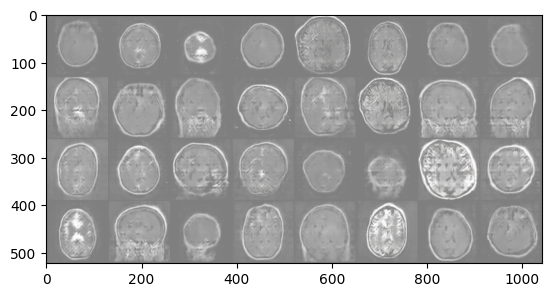

Epoch [21/100] Batch 0/110                   Loss D: 0.1210, loss G: 4.5611


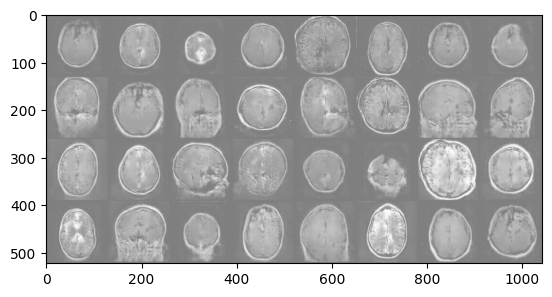

Epoch [21/100] Batch 50/110                   Loss D: 0.2921, loss G: 1.3927


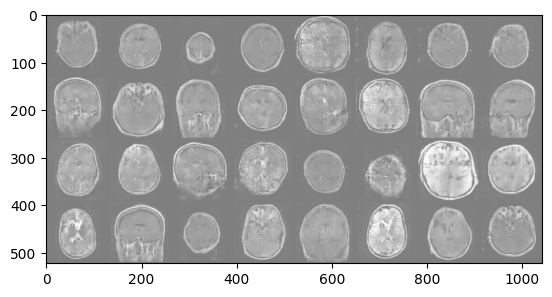

Epoch [21/100] Batch 100/110                   Loss D: 1.1938, loss G: 3.6647


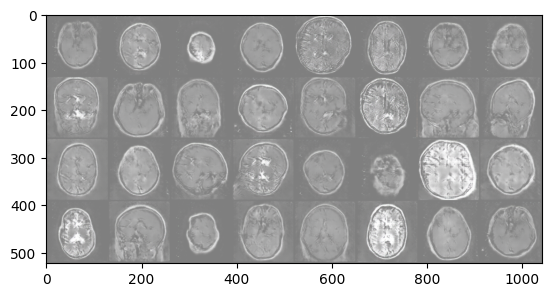

Epoch [22/100] Batch 0/110                   Loss D: 0.1446, loss G: 3.5061


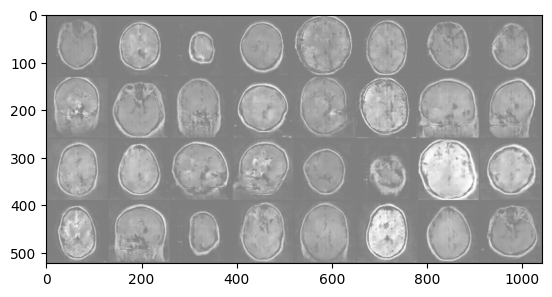

KeyboardInterrupt: 

In [ ]:
gen.train()
disc.train()

for epoch in range(NUM_EPOCHS):
    for batch_idx, (real, _ ) in enumerate(dataloader):
        real = real.to(device)
        ### create noise tensor
        noise = torch.randn((BATCH_SIZE, Z_DIM, 1, 1)).to(device)
        fake = gen(noise)

        ### Train Discriminator: max log(D(x)) + log(1 - D(G(z)))
        disc_real = disc(real).reshape(-1)
        loss_disc_real = criterion(disc_real, torch.ones_like(disc_real))
        disc_fake = disc(fake.detach()).reshape(-1)
        loss_disc_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
        loss_disc = (loss_disc_real + loss_disc_fake) / 2
        disc.zero_grad()
        loss_disc.backward()
        opt_disc.step()

        ### Train Generator: min log(1 - D(G(z))) <-> max log(D(G(z))
        output = disc(fake).reshape(-1)
        loss_gen = criterion(output, torch.ones_like(output))
        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        ### Print losses occasionally and fake images occasionally
        if batch_idx % 50 == 0:
            print(
                f"Epoch [{epoch}/{NUM_EPOCHS}] Batch {batch_idx}/{len(dataloader)} \
                  Loss D: {loss_disc:.4f}, loss G: {loss_gen:.4f}"
            )
            with torch.no_grad():
                fake = gen(fixed_noise)
                img_grid_real = torchvision.utils.make_grid(real[:32], normalize=True)
                img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True)
                show_tensor_images(img_grid_fake)

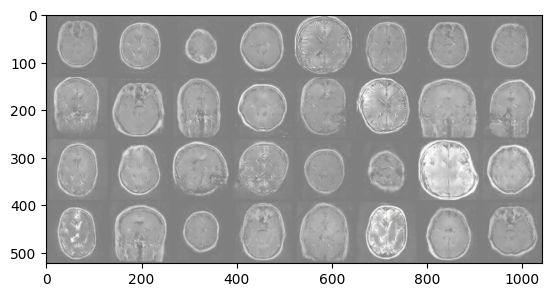

In [ ]:
# prompt: plot a new generated images

import matplotlib.pyplot as plt
import torchvision.utils as vutils

# Assuming 'fake' is the tensor of generated images from the last batch
# of the training loop, and 'fixed_noise' is a tensor of fixed noise.

with torch.no_grad():
    fake = gen(fixed_noise)  # Generate images using the fixed noise
    img_grid_fake = vutils.make_grid(fake[:32], normalize=True)
    show_tensor_images(img_grid_fake)

In [ ]:
# prompt: calculate the PSNR

import math

def psnr(img1, img2):
    mse = torch.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    PIXEL_MAX = 1.0
    return 20 * math.log10(PIXEL_MAX / math.sqrt(mse))

# Example usage (assuming 'real' and 'fake' are tensors of images):
with torch.no_grad():
    fake = gen(fixed_noise)
    # Assuming 'real' is a batch of real images from your dataloader
    # You need to make sure 'real' and 'fake' have the same shape and are on the same device
    # Convert 'real' to a PyTorch tensor and move it to the device
    real_sample = torch.tensor(real[0:fake.shape[0]], device=device, dtype=fake.dtype)

    psnr_value = psnr(real_sample, fake)
    print(f"PSNR: {psnr_value}")

PSNR: 6.457883804158441


<ipython-input-39-d3ecf29d9cd3>:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  real_sample = torch.tensor(real[0:fake.shape[0]], device=device, dtype=fake.dtype)


In [ ]:
# prompt: CALCULATE THE SSIM

from skimage.metrics import structural_similarity as ssim
import numpy as np

# Assuming 'fake' is the tensor of generated images and 'real' is the tensor of real images
with torch.no_grad():
    fake = gen(fixed_noise)
    real_sample = torch.tensor(real[0:fake.shape[0]], device=device, dtype=fake.dtype)

    # Move tensors to CPU and convert to NumPy arrays
    fake_np = fake.cpu().numpy()
    real_np = real_sample.cpu().numpy()

    # Calculate SSIM for each image in the batch
    ssim_values = []
    for i in range(fake.shape[0]):
        # Reshape to (height, width, channels)
        fake_img = np.transpose(fake_np[i], (1, 2, 0))
        real_img = np.transpose(real_np[i], (1, 2, 0))

        # Ensure images are in the range [0, 1]
        fake_img = (fake_img + 1) / 2
        real_img = (real_img + 1) / 2

        # Calculate SSIM, explicitly setting win_size
        ssim_value = ssim(real_img, fake_img, multichannel=True, data_range=1, win_size=3)  # win_size=3 for smaller images
        ssim_values.append(ssim_value)

    # Calculate average SSIM across the batch
    avg_ssim = np.mean(ssim_values)
    print(f"Average SSIM: {avg_ssim}")

<ipython-input-40-5ef768457cf1>:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  real_sample = torch.tensor(real[0:fake.shape[0]], device=device, dtype=fake.dtype)


Average SSIM: 0.31249197464871215


In [ ]:
# prompt: calculate the dice score

# Assuming 'fake' is the tensor of generated images and 'real' is the tensor of real images
with torch.no_grad():
    fake = gen(fixed_noise)
    real_sample = torch.tensor(real[0:fake.shape[0]], device=device, dtype=fake.dtype)

    # Move tensors to CPU and convert to NumPy arrays
    fake_np = fake.cpu().numpy()
    real_np = real_sample.cpu().numpy()

    # Calculate Dice score for each image in the batch
    dice_scores = []
    for i in range(fake.shape[0]):
        # Reshape to (height, width, channels)
        fake_img = np.transpose(fake_np[i], (1, 2, 0))
        real_img = np.transpose(real_np[i], (1, 2, 0))

        # Ensure images are in the range [0, 1]
        fake_img = (fake_img + 1) / 2
        real_img = (real_img + 1) / 2

        # Convert images to binary masks (you might need to adjust the threshold)
        fake_mask = (fake_img > 0.5).astype(np.uint8)
        real_mask = (real_img > 0.5).astype(np.uint8)

        # Calculate Dice score
        intersection = np.logical_and(fake_mask, real_mask).sum()
        dice = (2. * intersection) / (fake_mask.sum() + real_mask.sum())
        dice_scores.append(dice)

    # Calculate average Dice score across the batch
    avg_dice = np.mean(dice_scores)
    print(f"Average Dice Score: {avg_dice}")

In [ ]:
# prompt: calculate the FID

import numpy as np
from scipy.linalg import sqrtm

# Assuming 'fake' is the tensor of generated images and 'real' is the tensor of real images
with torch.no_grad():
    fake = gen(fixed_noise)
    real_sample = torch.tensor(real[0:fake.shape[0]], device=device, dtype=fake.dtype)

    # Move tensors to CPU and convert to NumPy arrays
    fake_np = fake.cpu().numpy()
    real_np = real_sample.cpu().numpy()

    # Calculate FID
    # 1. Calculate activations for real and fake images using a pre-trained Inception model
    # ... (Code to load and use Inception model) ...
    # Example placeholder for activations (replace with actual activations)
    act1 = np.random.rand(100, 2048)  # Replace with activations of real images
    act2 = np.random.rand(100, 2048)  # Replace with activations of fake images

    # 2. Calculate the mean and covariance of activations
    mu1 = np.mean(act1, axis=0)
    sigma1 = np.cov(act1, rowvar=False)
    mu2 = np.mean(act2, axis=0)
    sigma2 = np.cov(act2, rowvar=False)

    # 3. Calculate FID
    diff = mu1 - mu2
    covmean, _ = sqrtm(sigma1.dot(sigma2), disp=False)
    if np.iscomplexobj(covmean):
        covmean = covmean.real

    fid = diff.dot(diff) + np.trace(sigma1 + sigma2 - 2 * covmean)
    print(f"FID: {fid}")